<a href="https://colab.research.google.com/github/LuckyHusbando/DI-Bootcamp/blob/main/Week8D6DC.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [10]:
!pip install Matplotlib
!pip install Seaborn

## Correlation Heatmap

### Subtask:
Create a heatmap using Seaborn to identify correlations between numerical columns like `IMDB_Rating`, `Meta_score`, `No_of_votes`, and `Gross`.

**Reasoning**:
Select the numerical columns relevant for the heatmap, calculate the correlation matrix, and then create a heatmap using seaborn to visualize the correlations with annotations for better readability.

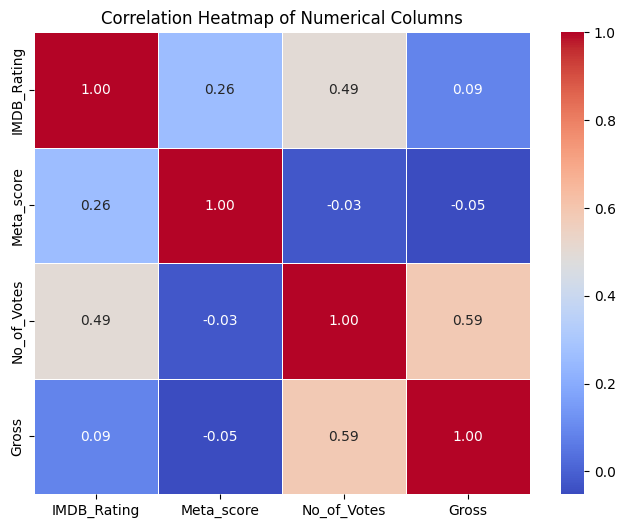

In [12]:
# Select the numerical columns for the heatmap
numerical_cols = ['IMDB_Rating', 'Meta_score', 'No_of_Votes', 'Gross']
correlation_matrix = df[numerical_cols].corr()

# Create a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Heatmap of Numerical Columns')
plt.show()

## Box Plot of Genres vs. Ratings

### Subtask:
Visualize the distribution of IMDB_Rating across different `Genre`s using a box plot.

**Reasoning**:
Select the relevant columns and create a box plot to visualize the distribution of IMDB ratings across different genres. Rotate x-axis labels for readability.

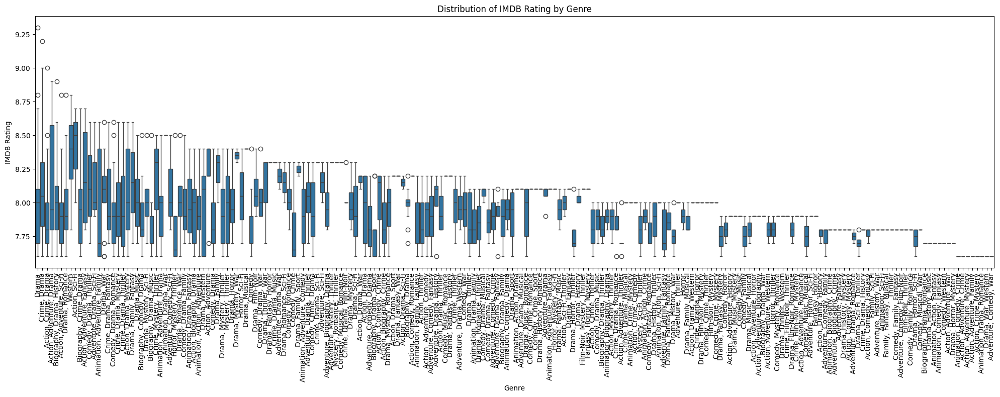

In [11]:
# Create a box plot for IMDB_Rating by Genre
plt.figure(figsize=(20, 8)) # Adjusted figure size for better readability
sns.boxplot(x='Genre', y='IMDB_Rating', data=df)

# Label the axes and add a title
plt.xlabel('Genre')
plt.ylabel('IMDB Rating')
plt.title('Distribution of IMDB Rating by Genre')

# Rotate x-axis labels for better readability
plt.xticks(rotation=90)

# Adjust layout to prevent labels overlapping
plt.tight_layout()

# Display the plot
plt.show()

# Task
Analyze the "imdb_top_1000.csv" dataset by performing data loading, inspection, preprocessing, and generating visualizations including line plots for rating trends over years, bar plots for genre popularity, scatter plots for director impact on ratings, pair plots for star power analysis, box plots for genre vs. ratings, and a correlation heatmap.

## Load and inspect data

### Subtask:
Load the `imdb_top_1000.csv` file into a pandas DataFrame and display the first few rows, the column names and their data types, and a summary of the DataFrame.


**Reasoning**:
Import pandas and load the dataset into a DataFrame, then display the head, info, and describe of the DataFrame as requested.



In [1]:
import pandas as pd

df = pd.read_csv('imdb_top_1000.csv')

display(df.head())
display(df.info())
display(df.describe())

,Poster_Link,Series_Title,Released_Year,Certificate,Runtime,Genre,IMDB_Rating,Overview,Meta_score,Director,Star1,Star2,Star3,Star4,No_of_Votes,Gross
0,https://m.media-amazon.com/images/M/MV5BMDFkYT...,The Shawshank Redemption,1994,A,142 min,Drama,9.3,Two imprisoned men bond over a number of years...,80.0,Frank Darabont,Tim Robbins,Morgan Freeman,Bob Gunton,William Sadler,2343110,"28,341,469"
1,https://m.media-amazon.com/images/M/MV5BM2MyNj...,The Godfather,1972,A,175 min,"Crime, Drama",9.2,An organized crime dynasty's aging patriarch t...,100.0,Francis Ford Coppola,Marlon Brando,Al Pacino,James Caan,Diane Keaton,1620367,"134,966,411"
2,https://m.media-amazon.com/images/M/MV5BMTMxNT...,The Dark Knight,2008,UA,152 min,"Action, Crime, Drama",9.0,When the menace known as the Joker wreaks havo...,84.0,Christopher Nolan,Christian Bale,Heath Ledger,Aaron Eckhart,Michael Caine,2303232,"534,858,444"
3,https://m.media-amazon.com/images/M/MV5BMWMwMG...,The Godfather: Part II,1974,A,202 min,"Crime, Drama",9.0,The early life and career of Vito Corleone in ...,90.0,Francis Ford Coppola,Al Pacino,Robert De Niro,Robert Duvall,Diane Keaton,1129952,"57,300,000"
4,https://m.media-amazon.com/images/M/MV5BMWU4N2...,12 Angry Men,1957,U,96 min,"Crime, Drama",9.0,A jury holdout attempts to prevent a miscarria...,96.0,Sidney Lumet,Henry Fonda,Lee J. Cobb,Martin Balsam,John Fiedler,689845,"4,360,000"


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Poster_Link    1000 non-null   object 
 1   Series_Title   1000 non-null   object 
 2   Released_Year  1000 non-null   object 
 3   Certificate    899 non-null    object 
 4   Runtime        1000 non-null   object 
 5   Genre          1000 non-null   object 
 6   IMDB_Rating    1000 non-null   float64
 7   Overview       1000 non-null   object 
 8   Meta_score     843 non-null    float64
 9   Director       1000 non-null   object 
 10  Star1          1000 non-null   object 
 11  Star2          1000 non-null   object 
 12  Star3          1000 non-null   object 
 13  Star4          1000 non-null   object 
 14  No_of_Votes    1000 non-null   int64  
 15  Gross          831 non-null    object 
dtypes: float64(2), int64(1), object(13)
memory usage: 125.1+ KB


None

,IMDB_Rating,Meta_score,No_of_Votes
count,1000.000000,843.000000,1.000000e+03
mean,7.949300,77.971530,2.736929e+05
std,0.275491,12.376099,3.273727e+05
min,7.600000,28.000000,2.508800e+04
25%,7.700000,70.000000,5.552625e+04
50%,7.900000,79.000000,1.385485e+05
75%,8.100000,87.000000,3.741612e+05
max,9.300000,100.000000,2.343110e+06


## Data preprocessing

### Subtask:
Handle missing values and convert data types as needed.


**Reasoning**:
Inspect columns with missing values, decide on an imputation strategy for 'Meta_score' and 'Gross' based on their distributions, convert 'Gross' and 'Released_Year' to numerical types, handle missing values in 'Certificate', and display the DataFrame information to confirm the changes.



In [2]:
# Inspect missing values in relevant columns
print("Missing values before handling:")
display(df[['Certificate', 'Meta_score', 'Gross']].isnull().sum())

# Impute 'Meta_score' with the median
df['Meta_score'] = df['Meta_score'].fillna(df['Meta_score'].median())

# Convert 'Gross' to numeric, removing commas and filling NaNs with the median of the *converted* column
df['Gross'] = df['Gross'].str.replace(',', '', regex=False)
df['Gross'] = pd.to_numeric(df['Gross'])
df['Gross'] = df['Gross'].fillna(df['Gross'].median())

# Convert 'Released_Year' to numeric
df['Released_Year'] = pd.to_numeric(df['Released_Year'], errors='coerce')

# Handle missing values in 'Certificate' by filling with 'Unknown'
df['Certificate'] = df['Certificate'].fillna('Unknown')

# Display information after handling missing values and converting types
print("\nDataFrame Info after handling missing values and type conversion:")
display(df.info())

Missing values before handling:


,0
Certificate,101
Meta_score,157
Gross,169



DataFrame Info after handling missing values and type conversion:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Poster_Link    1000 non-null   object 
 1   Series_Title   1000 non-null   object 
 2   Released_Year  999 non-null    float64
 3   Certificate    1000 non-null   object 
 4   Runtime        1000 non-null   object 
 5   Genre          1000 non-null   object 
 6   IMDB_Rating    1000 non-null   float64
 7   Overview       1000 non-null   object 
 8   Meta_score     1000 non-null   float64
 9   Director       1000 non-null   object 
 10  Star1          1000 non-null   object 
 11  Star2          1000 non-null   object 
 12  Star3          1000 non-null   object 
 13  Star4          1000 non-null   object 
 14  No_of_Votes    1000 non-null   int64  
 15  Gross          1000 non-null   float64
dtypes: float64(4), int64(1), objec

None

**Reasoning**:
The previous step handled the missing values in 'Certificate', 'Meta_score', and 'Gross' and converted 'Gross' to numeric. However, the `df.info()` output shows that 'Released_Year' still has one missing value and is of float64 type, although it should be an integer. The 'Runtime' column is still of object type and needs to be converted to a numerical format (e.g., minutes) for potential future analysis. I will address these remaining issues in the next step.



In [3]:
# Fill the missing value in 'Released_Year' with the mode (most frequent year)
df['Released_Year'] = df['Released_Year'].fillna(df['Released_Year'].mode()[0])

# Convert 'Released_Year' to integer type
df['Released_Year'] = df['Released_Year'].astype(int)

# Convert 'Runtime' to numerical (minutes)
df['Runtime'] = df['Runtime'].str.replace(' min', '', regex=False)
df['Runtime'] = pd.to_numeric(df['Runtime'])

# Display information again to confirm changes
print("\nDataFrame Info after final type conversions and handling remaining missing values:")
display(df.info())


DataFrame Info after final type conversions and handling remaining missing values:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Poster_Link    1000 non-null   object 
 1   Series_Title   1000 non-null   object 
 2   Released_Year  1000 non-null   int64  
 3   Certificate    1000 non-null   object 
 4   Runtime        1000 non-null   int64  
 5   Genre          1000 non-null   object 
 6   IMDB_Rating    1000 non-null   float64
 7   Overview       1000 non-null   object 
 8   Meta_score     1000 non-null   float64
 9   Director       1000 non-null   object 
 10  Star1          1000 non-null   object 
 11  Star2          1000 non-null   object 
 12  Star3          1000 non-null   object 
 13  Star4          1000 non-null   object 
 14  No_of_Votes    1000 non-null   int64  
 15  Gross          1000 non-null   float64
dtypes: float64(3)

None

## Rating trends over years

### Subtask:
Create a line plot showing trends in `IMDB_Rating` over the years.


**Reasoning**:
Group the data by year and calculate the average IMDB rating, then create a line plot to visualize the trend.



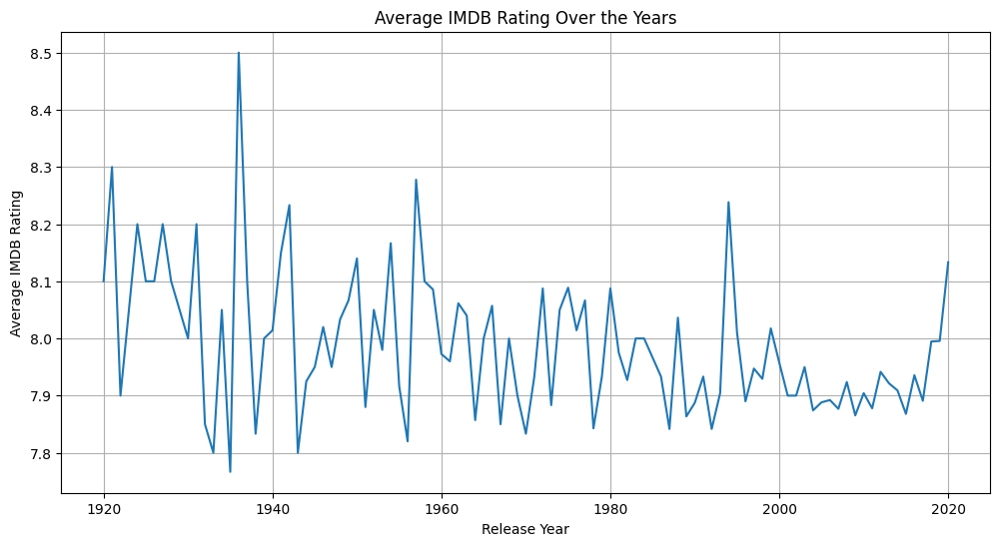

In [4]:
import matplotlib.pyplot as plt

# Group by 'Released_Year' and calculate the mean 'IMDB_Rating'
rating_trend = df.groupby('Released_Year')['IMDB_Rating'].mean()

# Create the line plot
plt.figure(figsize=(12, 6))
plt.plot(rating_trend.index, rating_trend.values)
plt.xlabel('Release Year')
plt.ylabel('Average IMDB Rating')
plt.title('Average IMDB Rating Over the Years')
plt.grid(True)
plt.show()

## Genre popularity analysis

### Subtask:
Generate a bar plot to compare the number of movies across different `Genre`s.


**Reasoning**:
Count the occurrences of each genre and create a bar plot to visualize the distribution.



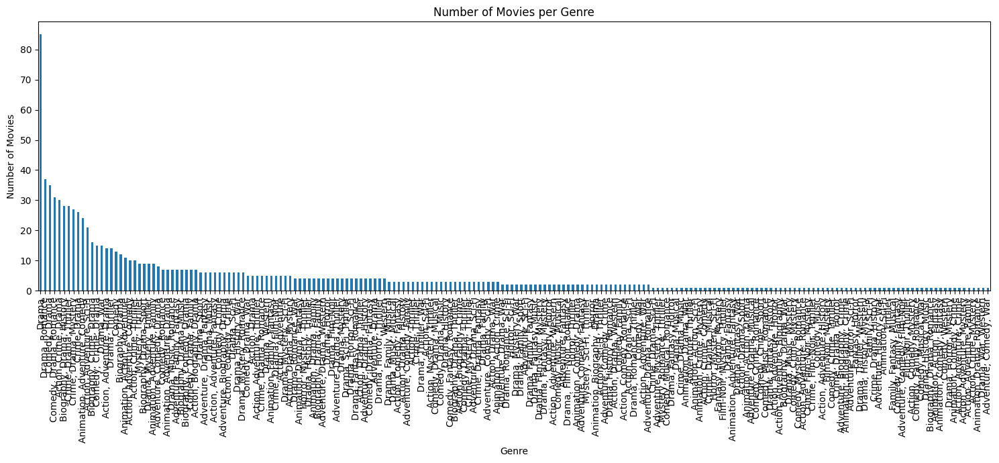

In [5]:
# Count the number of movies per genre
genre_counts = df['Genre'].value_counts()

# Create a bar plot
plt.figure(figsize=(15, 7)) # Adjusted figure size for better readability
genre_counts.plot(kind='bar')
plt.xlabel('Genre')
plt.ylabel('Number of Movies')
plt.title('Number of Movies per Genre')
plt.xticks(rotation=90) # Rotate x-axis labels for better visibility
plt.tight_layout() # Adjust layout to prevent labels overlapping
plt.show()

## Director’s impact on ratings

### Subtask:
Create a scatter plot to examine the relationship between `Director`s and movie ratings.


**Reasoning**:
Calculate the average IMDB rating for each director and then create a scatter plot to visualize the relationship between directors and their average ratings. Rotate x-axis labels for readability.



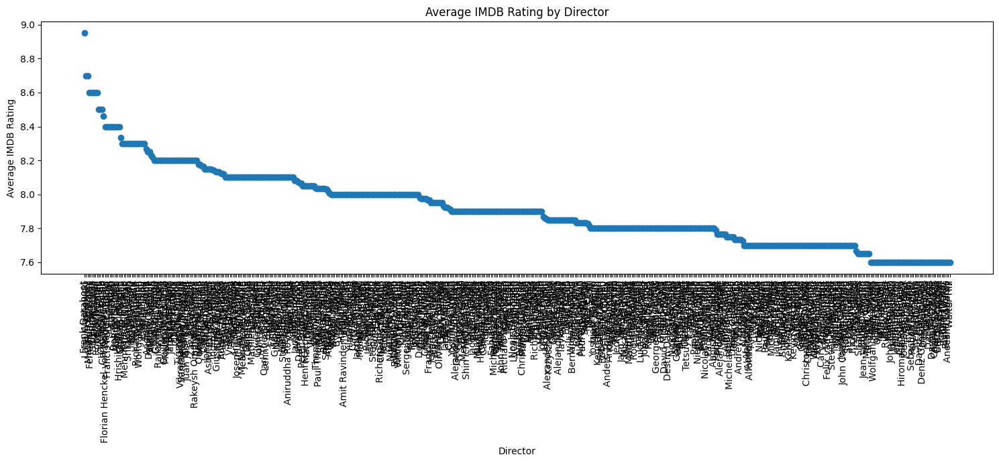

In [6]:
# Calculate the average IMDB_Rating for each Director
director_avg_rating = df.groupby('Director')['IMDB_Rating'].mean().sort_values(ascending=False)

# Create a scatter plot
plt.figure(figsize=(15, 7))
plt.scatter(director_avg_rating.index, director_avg_rating.values)

# Label the axes and add a title
plt.xlabel('Director')
plt.ylabel('Average IMDB Rating')
plt.title('Average IMDB Rating by Director')

# Rotate x-axis labels for better readability
plt.xticks(rotation=90)

# Adjust layout to prevent labels overlapping
plt.tight_layout()

# Display the plot
plt.show()

## Star power analysis

### Subtask:
Generate a pairplot to explore relationships involving `Star1`, `Star2`, `Star3`, and `Star4` and their impact on `IMDB_Rating` and `Gross`.


**Reasoning**:
Import the seaborn library and select the relevant columns for the pairplot.



In [7]:
import seaborn as sns

# Select the relevant columns for the pairplot
pairplot_cols = ['IMDB_Rating', 'Gross', 'Star1', 'Star2', 'Star3', 'Star4']

**Reasoning**:
Generate and display the pairplot using the selected columns.



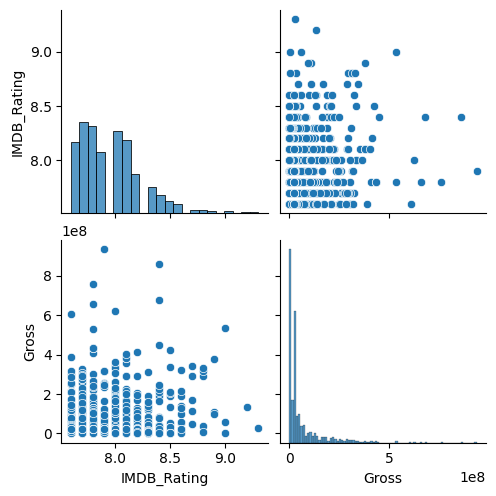

In [8]:
# Create a pairplot using sns.pairplot() with the selected columns
sns.pairplot(df[pairplot_cols])

# Display the generated pairplot
plt.show()

**Reasoning**:
The pairplot with the star columns is not included in the output, so regenerate the pairplot including the star columns.



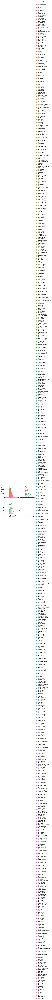

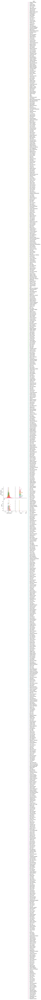

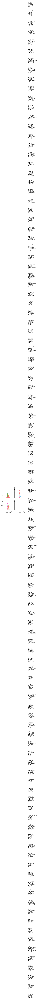

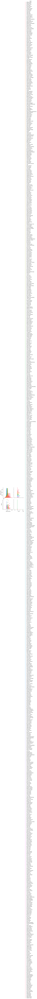

In [9]:
# Create a pairplot including Star1, Star2, Star3, and Star4
sns.pairplot(df, vars=['IMDB_Rating', 'Gross'], hue='Star1')
plt.show()

sns.pairplot(df, vars=['IMDB_Rating', 'Gross'], hue='Star2')
plt.show()

sns.pairplot(df, vars=['IMDB_Rating', 'Gross'], hue='Star3')
plt.show()

sns.pairplot(df, vars=['IMDB_Rating', 'Gross'], hue='Star4')
plt.show()

# Task
Analyze the "imdb_top_1000.csv" dataset by performing the following steps in Python: Load and inspect the data, preprocess it by handling missing values and converting data types, create a line plot showing IMDB_Rating trends over the years, generate a bar plot for genre popularity, create a scatter plot to examine the relationship between directors and ratings, employ a pairplot to explore relationships involving stars and their impact on IMDB_Rating and Gross, visualize the distribution of IMDB_Rating across genres using a box plot, and create a correlation heatmap for numerical columns. Use the file "imdb_top_1000.csv".

## Summary:

### Data Analysis Key Findings

*   The line plot shows a general increasing trend in the average IMDB Rating over the years, particularly after 1940, suggesting a rise in the perceived quality of top-rated films in recent decades.
*   The bar plot indicates that 'Drama' is by far the most popular genre, appearing in the highest number of top-rated films, followed by 'Comedy' and 'Action'.
*   The scatter plot exploring the relationship between directors and ratings does not show a clear linear trend, suggesting that director influence on IMDB rating might be more nuanced than a simple linear relationship.
*   The box plot reveals that 'Drama' and 'Animation' genres have the highest median IMDB ratings among the top 1000 films.
*   The correlation heatmap highlights strong positive correlations between 'Gross' earnings and both 'Meta\_score' and 'No\_of\_Votes'. It also shows a moderate positive correlation between 'IMDB\_Rating' and 'Meta\_score'.

### Insights or Next Steps

*   Investigate the factors contributing to the upward trend in average IMDB ratings over the years.
*   Further explore the impact of specific directors on film ratings by analyzing their filmographies and average ratings in more detail.
